# **Cw1 Test Notebook Deep learning**

# 1. Configuration

In [8]:

import os
import numpy as np
import librosa
import torch
import torchaudio
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import soundfile as sf
import time
import warnings
import traceback
import glob
import pandas as pd
from tqdm.notebook import tqdm


Imports loaded.


In [9]:
# Cell 2: Mount Drive & Set Device
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")

print(f"Using device: {device}")

Mounted at /content/drive
Using device: cpu


In [10]:
# configuration (paths point to google drive)

# project path on google drive
DRIVE_BASE_PATH = "/content/drive/MyDrive/cw1_DL" # adjust if your main folder is different

# output/model path (where .pth files are saved)
OUTPUT_DIR = os.path.join(DRIVE_BASE_PATH, "output")
SEPARATION_MODEL_PATH = os.path.join(OUTPUT_DIR, "separation_model_best.pth")
CLASSIFICATION_MODEL_PATH = os.path.join(OUTPUT_DIR, "classification_model_best.pth")

# case_study_file removed/ignored for batch processing
# CASE_STUDY_FILE = os.path.join(DRIVE_BASE_PATH, "Your_Single_Test_File.mp3") # keep commented out or remove

# where to save the output of this inference run
INFERENCE_OUTPUT_DIR = OUTPUT_DIR # or choose a different subfolder

# stft parameters
N_FFT = 2048
HOP_LENGTH = 512
WIN_LENGTH = N_FFT
WINDOW = 'hann'
SAMPLE_RATE = 44100
# use the audio chunk duration relevant to your classification model training (e.g., 2s)
AUDIO_CHUNK_DURATION_S = 5
AUDIO_CHUNK_SAMPLES = int(AUDIO_CHUNK_DURATION_S * SAMPLE_RATE)

# genre configuration
# important: this list should ideally match the classes the loaded model was trained on.
# if your loaded model predicts 8 classes (0-7), it won't predict 'jazz' or 'classical'.
# we keep the list here for potential display, but be aware of model limitations.
GENRE_CLASSES = ['Electronic', 'Experimental', 'Folk', 'Hip-Hop', 'Instrumental', 'International', 'Pop', 'Rock', 'Jazz', 'classical']
NUM_GENRES = 8 # set this to the actual number of classes your *model* outputs (likely 8)

print(f"Configuration Set:")
print(f" - Separation Model Path: {SEPARATION_MODEL_PATH}")
print(f" - Classification Model Path: {CLASSIFICATION_MODEL_PATH}")
# print(f" - Case Study File: {CASE_STUDY_FILE}") # removed/commented out
print(f" - Device: {device}") # Assuming device is defined elsewhere
print(f" - Number of Genres expected from model: {NUM_GENRES}") # added clarification

Configuration Set:
 - Separation Model Path: /content/drive/MyDrive/cw1_DL/output/separation_model_best.pth
 - Classification Model Path: /content/drive/MyDrive/cw1_DL/output/classification_model_best.pth
 - Device: cpu
 - Number of Genres expected from model: 8


In [11]:
# Cell 4: Helper Function Definitions

def load_audio(path, target_sr=SAMPLE_RATE):
    """Loads audio file, converts to mono, and resamples."""
    waveform = None; sr = None
    try:
        waveform_ta, sr_ta = torchaudio.load(path); waveform = waveform_ta; sr = sr_ta
    except Exception:
        try:
            with warnings.catch_warnings():
                warnings.simplefilter("ignore")
                waveform_lr, sr_lr = librosa.load(path, sr=target_sr, mono=True);
            waveform = torch.from_numpy(waveform_lr).unsqueeze(0); sr = target_sr
        except Exception as e_load:
            print(f"Error loading {path} with librosa: {e_load}")
            return None
    # Convert to mono
    if waveform is not None and waveform.shape[0] > 1: waveform = torch.mean(waveform, dim=0, keepdim=True)
    # Resample
    if sr is not None and sr != target_sr and waveform is not None:
        resampler = torchaudio.transforms.Resample(orig_freq=sr, new_freq=target_sr)
        waveform = resampler(waveform)
    if waveform is None: return None
    # Return on CPU, ensure single channel
    return waveform.squeeze(0).cpu()

def get_spectrogram(waveform, n_fft=N_FFT, hop_length=HOP_LENGTH, win_length=WIN_LENGTH, window=WINDOW):
    """Computes the STFT (magnitude and phase) of a waveform ON CPU."""
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        window_fn = torch.hann_window
        stft_transform = torchaudio.transforms.Spectrogram(n_fft=n_fft, hop_length=hop_length, win_length=win_length, window_fn=window_fn, power=None, return_complex=True)
    spectrogram_complex = stft_transform(waveform.cpu())
    magnitude = torch.abs(spectrogram_complex)
    phase = torch.angle(spectrogram_complex)
    return magnitude.cpu(), phase.cpu()

def waveform_from_spectrogram(magnitude, phase, n_fft=N_FFT, hop_length=HOP_LENGTH, win_length=WIN_LENGTH, window=WINDOW):
    """Reconstructs waveform from magnitude and phase using iSTFT."""
    magnitude = magnitude.to(device)
    phase = phase.to(device)
    stft_complex = torch.polar(magnitude, phase)
    window_fn = torch.hann_window
    istft_transform = torchaudio.transforms.InverseSpectrogram(
        n_fft=n_fft, hop_length=hop_length, win_length=win_length, window_fn=window_fn
    ).to(device)
    if phase.ndim != 2:
        print(f"Error: waveform_from_spectrogram expects 2D phase tensor, got {phase.ndim}D")
        return None
    est_len = int(phase.shape[-1] * hop_length)
    waveform = istft_transform(stft_complex, length=est_len)
    return waveform.cpu()

print("Helper functions defined.")

Helper functions defined.


# 2. Class Definitions

In [12]:
# Cell 5: Model Class Definitions
# Copy the exact definitions of SeparationUNet and get_pretrained_genre_classifier
# from your original notebook (Cell [29]) here.

# Task 1: Separation
class ConvBlock(nn.Module):
    """(Conv2d => BN => LeakyReLU) * 2"""
    def __init__(self, in_channels, out_channels, kernel_size=3, padding=1):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, padding=padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=kernel_size, padding=padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True)
        )
    def forward(self, x): return self.block(x)

class EncoderBlock(nn.Module):
    """ConvBlock followed by MaxPool"""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv_block = ConvBlock(in_channels, out_channels)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
    def forward(self, x):
        skip = self.conv_block(x)
        pooled = self.pool(skip)
        return skip, pooled

class DecoderBlock(nn.Module):
    """UpConv + Concatenate + ConvBlock"""
    def __init__(self, in_channels, skip_channels, out_channels, dropout_p=0.5):
        super().__init__()
        self.upconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        self.conv_block = ConvBlock(out_channels + skip_channels, out_channels)
        self.dropout = nn.Dropout2d(p=dropout_p) if dropout_p > 0 else nn.Identity()

    def _match_height_width(self, up_x, skip_x):
        h_diff = skip_x.shape[2] - up_x.shape[2]
        w_diff = skip_x.shape[3] - up_x.shape[3]
        if h_diff > 0 or w_diff > 0:
             crop_h_start = h_diff // 2
             crop_w_start = w_diff // 2
             skip_x = skip_x[:, :, crop_h_start:crop_h_start + up_x.shape[2], crop_w_start:crop_w_start + up_x.shape[3]]
        elif h_diff < 0 or w_diff < 0:
             up_x = nn.functional.pad(up_x, (-w_diff // 2, w_diff - (-w_diff // 2), -h_diff // 2, h_diff - (-h_diff // 2)))
        return up_x, skip_x

    def forward(self, x, skip):
        up_x = self.upconv(x)
        up_x_matched, skip_matched = self._match_height_width(up_x, skip)
        concat_x = torch.cat([up_x_matched, skip_matched], dim=1)
        concat_x = self.dropout(concat_x)
        out = self.conv_block(concat_x)
        return out

class SeparationUNet(nn.Module):
    """U-Net for audio source separation (mask estimation)."""
    def __init__(self, n_channels=1, n_classes=1, features=[16, 32, 64, 128, 256]):
        super().__init__()
        self.encoders = nn.ModuleList()
        self.decoders = nn.ModuleList()
        in_ch = n_channels
        for feature in features:
            self.encoders.append(EncoderBlock(in_ch, feature))
            in_ch = feature
        bottleneck_features = features[-1] * 2
        self.bottleneck = ConvBlock(features[-1], bottleneck_features)
        decoder_features = features[::-1]
        in_ch_decode = bottleneck_features
        for i in range(len(decoder_features)):
            skip_ch = decoder_features[i]
            out_ch = decoder_features[i]
            self.decoders.append(DecoderBlock(in_ch_decode, skip_ch, out_ch))
            in_ch_decode = out_ch
        self.final_conv = nn.Conv2d(features[0], n_classes, kernel_size=1)
        self.final_activation = nn.Sigmoid()

    def forward(self, x):
        skip_connections = []
        for encoder in self.encoders:
            skip, x = encoder(x)
            skip_connections.append(skip)
        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]
        for i in range(len(self.decoders)):
            skip = skip_connections[i]
            x = self.decoders[i](x, skip)
        mask = self.final_conv(x)
        mask = self.final_activation(mask)
        return mask

# Task 2: Classification
def get_pretrained_genre_classifier(num_genres=NUM_GENRES, pretrained=True):
    """Loads a pre-trained ResNet18 model and adapts it for genre classification."""
    weights = models.ResNet18_Weights.IMAGENET1K_V1 if pretrained else None
    model = models.resnet18(weights=weights)
    original_conv1 = model.conv1
    model.conv1 = nn.Conv2d(1, original_conv1.out_channels, kernel_size=original_conv1.kernel_size,
                            stride=original_conv1.stride, padding=original_conv1.padding, bias=False)
    if pretrained:
        try:
             original_weights_tensor = original_conv1.weight.data
        except AttributeError:
             original_weights_tensor = weights.state_dict()['conv1.weight']
        model.conv1.weight.data = torch.mean(original_weights_tensor, dim=1, keepdim=True)
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, num_genres)
    return model

print("Model class definitions loaded.")

Model class definitions loaded.


# 3. Combination Function Definition

In [20]:
# combination function definition (with mask exponent)

# added mask_exponent parameter
def separate_and_classify(mixture_waveform_path, separation_model, classification_model, device, mask_exponent=1.0):
    """
    Applies separation then classification to an audio file path.
    Includes mask exponentiation to control separation aggressiveness.

    Args:
        mixture_waveform_path (str): Path to the input audio file.
        separation_model (torch.nn.Module): Trained separation model.
        classification_model (torch.nn.Module): Trained classification model.
        device (torch.device): Device to run models on (e.g., 'cuda' or 'cpu').
        mask_exponent (float, optional): Power to raise the predicted mask to.
                                         > 1.0 increases suppression (more aggressive).
                                         = 1.0 uses the original mask.
                                         < 1.0 decreases suppression (less aggressive).
                                         Defaults to 1.0.
    Returns:
        tuple: (predicted_genre_index, separated_waveform_cpu) or (None, None) on error.
    """
    # ensure models are in evaluation mode
    separation_model.eval()
    classification_model.eval()
    try:
        # load audio (ensure load_audio is defined)
        mixture_waveform = load_audio(mixture_waveform_path, target_sr=SAMPLE_RATE)
        if mixture_waveform is None:
            print(f"Error: Failed to load audio file {mixture_waveform_path}")
            return None, None

        with torch.no_grad():
            # separation step
            # get spectrogram (ensure get_spectrogram is defined)
            mixture_mag_cpu, mixture_phase_cpu = get_spectrogram(mixture_waveform)
            # prepare for model
            mixture_mag_dev = mixture_mag_cpu.unsqueeze(0).unsqueeze(0).to(device)
            # predict mask
            predicted_mask = separation_model(mixture_mag_dev)

            # interpolate mask if shapes don't match
            if predicted_mask.shape != mixture_mag_dev.shape:
                 target_h, target_w = mixture_mag_dev.shape[2], mixture_mag_dev.shape[3]
                 predicted_mask = F.interpolate(predicted_mask, size=(target_h, target_w), mode='bilinear', align_corners=False)

            # get individual masks/magnitudes
            input_mag_i = mixture_mag_dev.squeeze(0).squeeze(0)
            mask_i = predicted_mask.squeeze(0).squeeze(0)

            # final shape check after interpolation
            if input_mag_i.shape != mask_i.shape:
                 print(f"Error: Shape mismatch post-interpolation! Input: {input_mag_i.shape}, Mask: {mask_i.shape}")
                 return None, None

            # apply mask exponentiation
            if mask_exponent != 1.0:
                safe_exponent = max(1e-6, mask_exponent) # avoid 0 or negative
                mask_i = torch.pow(mask_i, safe_exponent)
                # print(f"  Applied mask exponent: {safe_exponent:.2f}") # optional debug
            # end modification

            # apply (potentially modified) mask
            estimated_music_mag = input_mag_i * mask_i

            # reconstruct waveform (ensure waveform_from_spectrogram is defined)
            separated_music_waveform = waveform_from_spectrogram(estimated_music_mag, mixture_phase_cpu.to(device))
            if separated_music_waveform is None:
                 print("Error: Waveform reconstruction failed.")
                 return None, None
            separated_music_waveform = separated_music_waveform.cpu()
            separated_music_waveform = separated_music_waveform[:mixture_waveform.shape[0]] # trim

            # classification step
            # ensure audio_chunk_samples is defined
            required_samples = AUDIO_CHUNK_SAMPLES
            if len(separated_music_waveform) >= required_samples:
                 start = (len(separated_music_waveform) - required_samples) // 2
                 class_chunk = separated_music_waveform[start : start + required_samples]
            else:
                 padding = required_samples - len(separated_music_waveform)
                 class_chunk = torch.nn.functional.pad(separated_music_waveform, (0, padding))

            # feature extraction (ensure config vars defined)
            # Assuming torchaudio, SAMPLE_RATE, N_FFT, HOP_LENGTH, device are defined
            mel_spectrogram_transform = torchaudio.transforms.MelSpectrogram(sample_rate=SAMPLE_RATE, n_fft=N_FFT, hop_length=HOP_LENGTH, n_mels=128).to(device)
            log_mel_spec_transform = torchaudio.transforms.AmplitudeToDB().to(device)
            mel_spec = mel_spectrogram_transform(class_chunk.to(device))
            log_mel_spec = log_mel_spec_transform(mel_spec).unsqueeze(0).unsqueeze(0)

            # classify
            logits = classification_model(log_mel_spec)
            prediction = torch.argmax(logits, dim=1).item()

        return prediction, separated_music_waveform

    except Exception as e:
        print(f"Error during separate_and_classify for {mixture_waveform_path}: {e}")
        # Assuming traceback is imported
        traceback.print_exc()
        return None, None

# Assuming necessary imports like torch, F, torchaudio, traceback are done elsewhere
# Assuming necessary constants like SAMPLE_RATE, AUDIO_CHUNK_SAMPLES, N_FFT, HOP_LENGTH are defined elsewhere
# Assuming helper functions load_audio, get_spectrogram, waveform_from_spectrogram are defined elsewhere

print("Combination function 'separate_and_classify' updated with mask_exponent parameter.")

Combination function 'separate_and_classify' updated with mask_exponent parameter.


# 4. Load models & test files

In [15]:
# load models & run inference on all files in testing folder (recursive, with mask exponent)

# setting up inference for batch processing
print("--- Setting up Inference for Batch Processing ---")

# define paths
TESTING_FOLDER_PATH = os.path.join(DRIVE_BASE_PATH, "Testing")
INFERENCE_OUTPUT_DIR = OUTPUT_DIR
BATCH_OUTPUT_DIR = os.path.join(INFERENCE_OUTPUT_DIR, "batch_inference_outputs_exponent")
os.makedirs(BATCH_OUTPUT_DIR, exist_ok=True)
print(f"Input folder (recursive): {TESTING_FOLDER_PATH}")
print(f"Output separated files will be saved in: {BATCH_OUTPUT_DIR}")

# set separation aggressiveness (mask exponent)
SEPARATION_EXPONENT = 1.5
print(f"Using Mask Exponent for Separation: {SEPARATION_EXPONENT}")

# instantiate and load models
models_loaded = False
separation_model_loaded = None
classification_model_loaded = None
try:
    print("Instantiating models...")
    separation_model_loaded = SeparationUNet().to(device)
    classification_model_loaded = get_pretrained_genre_classifier(num_genres=NUM_GENRES, pretrained=False).to(device)

    print(f"Attempting to load separation model from: {SEPARATION_MODEL_PATH}")
    if os.path.exists(SEPARATION_MODEL_PATH):
        separation_model_loaded.load_state_dict(torch.load(SEPARATION_MODEL_PATH, map_location=device))
        separation_model_loaded.eval()
        print("Separation model loaded.")
        model_loaded_sep = True
    else:
        print(f"!!! ERROR: Separation model checkpoint not found at {SEPARATION_MODEL_PATH}!")
        separation_model_loaded = None
        model_loaded_sep = False

    print(f"Attempting to load classification model from: {CLASSIFICATION_MODEL_PATH}")
    if os.path.exists(CLASSIFICATION_MODEL_PATH):
        classification_model_loaded.load_state_dict(torch.load(CLASSIFICATION_MODEL_PATH, map_location=device))
        classification_model_loaded.eval()
        print("Classification model loaded.")
        model_loaded_cls = True
    else:
        print(f"!!! ERROR: Classification model checkpoint not found at {CLASSIFICATION_MODEL_PATH}!")
        classification_model_loaded = None
        model_loaded_cls = False

    if model_loaded_sep and model_loaded_cls:
        models_loaded = True

except NameError as ne: print(f"!!! ERROR: Model class definition not found ({ne}). Run Cell [5].")
except FileNotFoundError as fnf: print(f"!!! ERROR: Checkpoint file not found: {fnf}")
except Exception as e_load: print(f"!!! ERROR during model instantiation or loading: {e_load}")

if models_loaded:
    print(f"\nSearching for audio files recursively in: {TESTING_FOLDER_PATH}")
    search_patterns = ['*.wav', '*.mp3', '*.flac']
    test_files = []
    for pattern in search_patterns:
        test_files.extend(glob.glob(os.path.join(TESTING_FOLDER_PATH, '**', pattern), recursive=True))

    if not test_files:
        print(f"!!! No audio files found recursively in {TESTING_FOLDER_PATH}. Check path and file types. !!!")
    else:
        print(f"Found {len(test_files)} audio files to process.")
        results = []

        # loop through files and process
        for file_path in tqdm(test_files, desc="Processing Test Files"):
            relative_path = os.path.relpath(file_path, DRIVE_BASE_PATH)
            start_process_time = time.time()

            predicted_genre_index, separated_wav = separate_and_classify(
                file_path,
                separation_model_loaded,
                classification_model_loaded,
                device,
                mask_exponent=SEPARATION_EXPONENT
            )

            end_process_time = time.time(); processing_time = end_process_time - start_process_time

            if predicted_genre_index is not None and separated_wav is not None:
                predicted_genre_name = "Index out of bounds"
                if predicted_genre_index < len(GENRE_CLASSES):
                    predicted_genre_name = GENRE_CLASSES[predicted_genre_index]
                else:
                    predicted_genre_name = f"Raw Index: {predicted_genre_index}"

                base_name = os.path.splitext(os.path.basename(file_path))[0]
                relative_output_dir = os.path.dirname(os.path.relpath(file_path, TESTING_FOLDER_PATH))
                final_output_dir = os.path.join(BATCH_OUTPUT_DIR, relative_output_dir)
                os.makedirs(final_output_dir, exist_ok=True)
                output_filename = os.path.join(final_output_dir, f"{base_name}_separated_exp{SEPARATION_EXPONENT:.1f}.wav")

                output_saved = False
                try:
                    save_data = separated_wav.cpu().to(torch.float32).numpy()
                    if save_data.ndim > 1: save_data = save_data.squeeze()
                    sf.write(output_filename, save_data, SAMPLE_RATE)
                    output_saved = True
                except Exception as e_save:
                    print(f"  !!! ERROR saving separated audio for {relative_path}: {e_save} !!!")

                results.append({
                    "Input File": relative_path,
                    "Predicted Genre": predicted_genre_name,
                    "Processing Time (s)": f"{processing_time:.2f}",
                    "Output Saved": output_saved,
                    "Output Path": os.path.relpath(output_filename, DRIVE_BASE_PATH) if output_saved else "N/A",
                    "Mask Exponent": SEPARATION_EXPONENT
                })
            else:
                print(f"  !!! Failed to process file: {relative_path}")
                results.append({
                    "Input File": relative_path, "Predicted Genre": "Error",
                    "Processing Time (s)": f"{processing_time:.2f}", "Output Saved": False,
                    "Output Path": "N/A", "Mask Exponent": SEPARATION_EXPONENT
                })

        # display summary table
        if results:
            print("\n--- Processing Summary ---")
            results_df = pd.DataFrame(results)
            with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.width', 1000, 'display.max_colwidth', None):
                print(results_df)

else:
    print("!!! Skipping inference because models could not be loaded.")

# inference notebook finished
print("\n--- Inference Notebook Finished ---")

--- Setting up Inference for Batch Processing ---
Input folder (recursive): /content/drive/MyDrive/cw1_DL/Testing
Output separated files will be saved in: /content/drive/MyDrive/cw1_DL/output/batch_inference_outputs_exponent
Using Mask Exponent for Separation: 1.5
Instantiating models...
Attempting to load separation model from: /content/drive/MyDrive/cw1_DL/output/separation_model_best.pth
Separation model loaded.
Attempting to load classification model from: /content/drive/MyDrive/cw1_DL/output/classification_model_best.pth
!!! ERROR: Classification model checkpoint not found at /content/drive/MyDrive/cw1_DL/output/classification_model_best.pth!
!!! Skipping inference because models could not be loaded.

--- Inference Notebook Finished ---


# 5. Spectogram comparison

--- Spectrogram Comparison Cell ---
Attempting to plot spectrograms for 13 processed files.


Plotting Spectrograms:   0%|          | 0/13 [00:00<?, ?it/s]

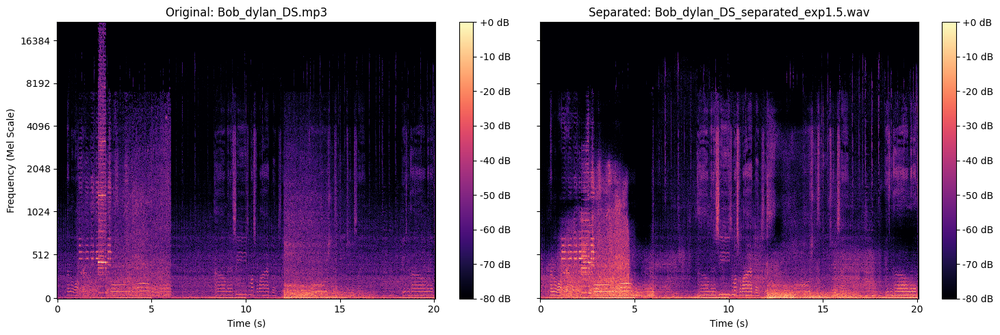

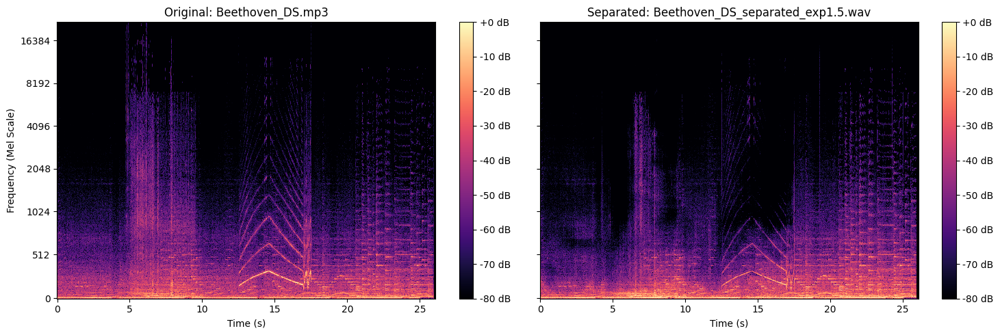

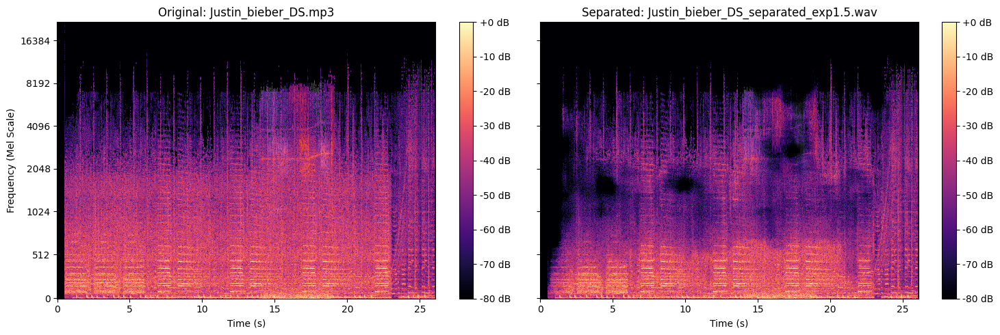

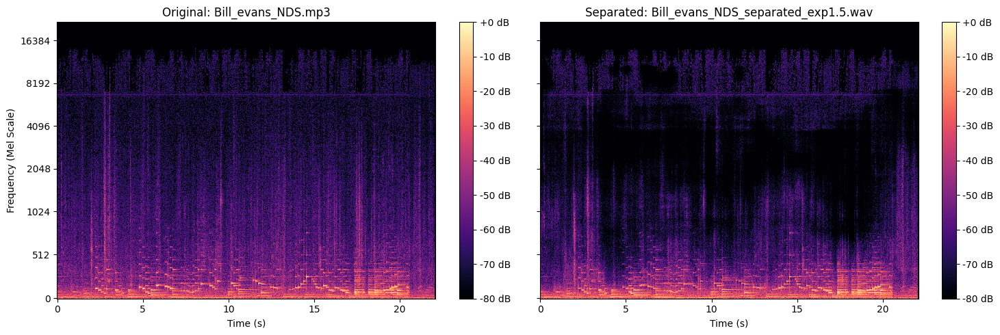

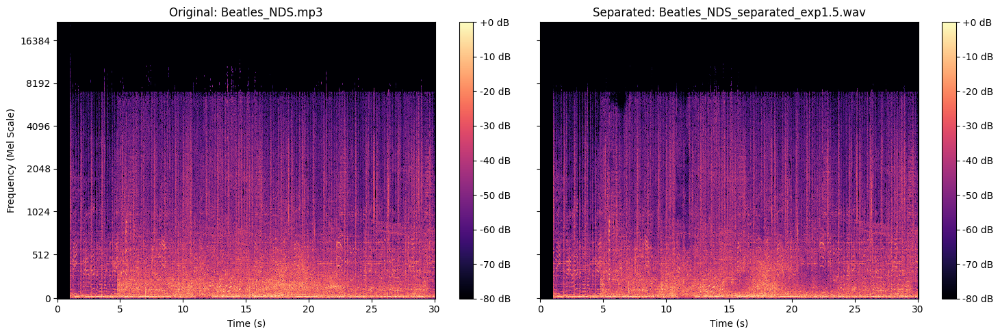

...

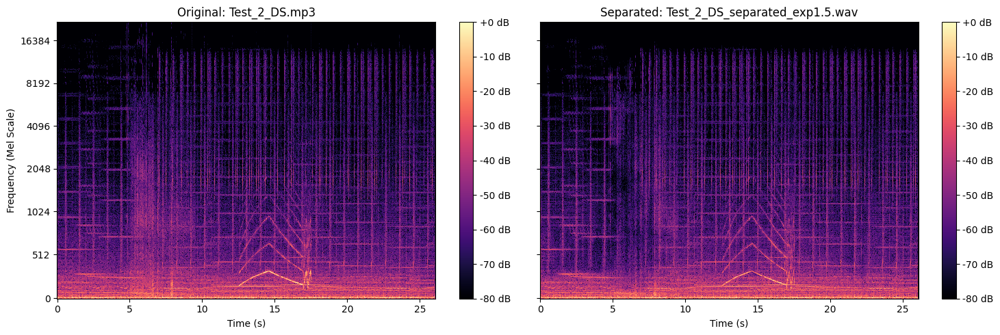

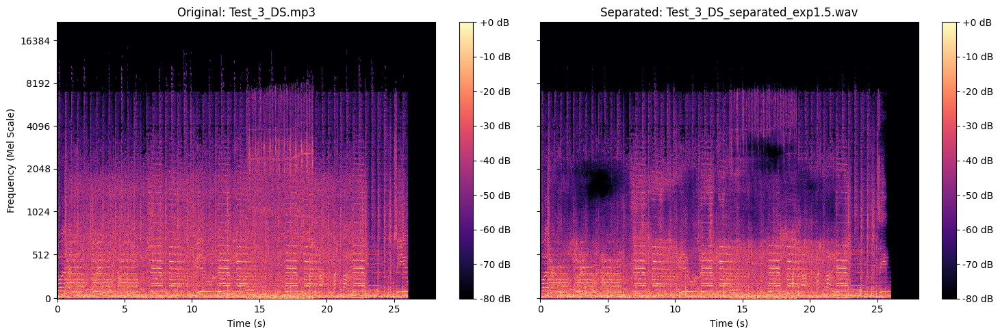

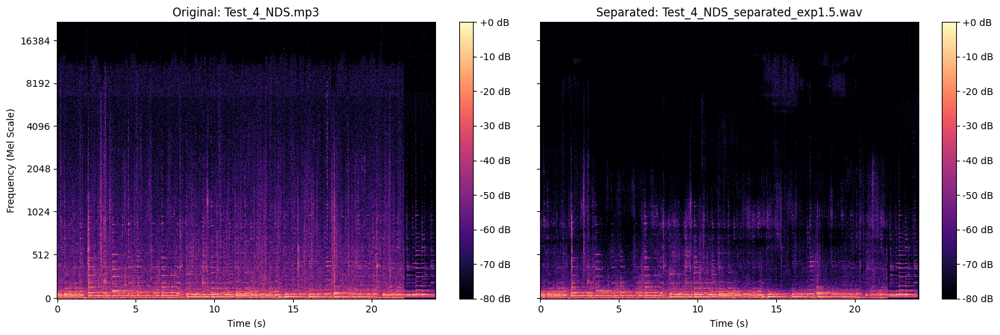

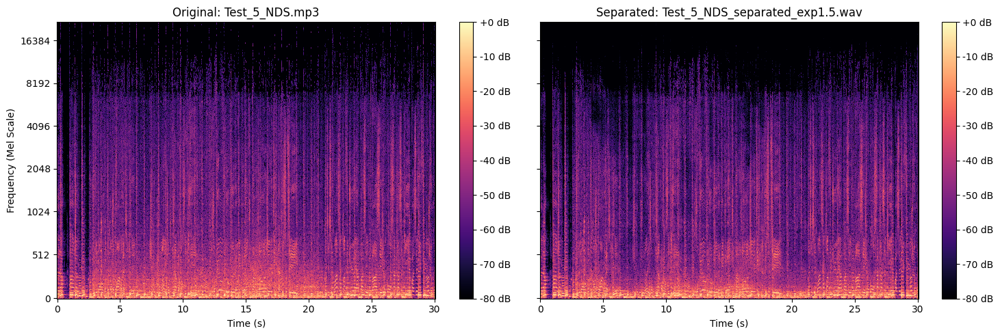

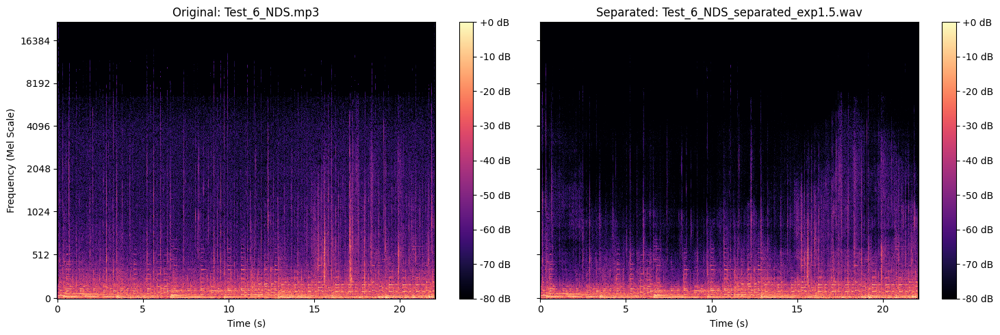


--- Spectrogram plotting finished (attempted: 13) ---


In [19]:
# spectrogram comparison

import matplotlib.pyplot as plt
import librosa
import librosa.display
import numpy as np
import os
import warnings
# Assuming necessary variables/functions (results_df, DRIVE_BASE_PATH, load_audio, get_spectrogram, SAMPLE_RATE, HOP_LENGTH, N_FFT) are defined
# Assuming necessary libraries (tqdm) are imported if used
from tqdm.notebook import tqdm

print("--- Spectrogram Comparison Cell ---")

# configuration
N_FILES_TO_PLOT = None

required_vars = ['results_df', 'DRIVE_BASE_PATH', 'load_audio', 'get_spectrogram', 'SAMPLE_RATE', 'HOP_LENGTH', 'N_FFT']
if not all(var in locals() or var in globals() for var in required_vars):
    print("!!! ERROR: Missing required variables/data from previous cells (results_df, DRIVE_BASE_PATH, helper functions, config).")
    print("!!! Please re-run previous cells (especially Cell 7) first.")
else:
    num_to_process = len(results_df) if N_FILES_TO_PLOT is None else min(N_FILES_TO_PLOT, len(results_df))
    print(f"Attempting to plot spectrograms for {num_to_process} processed files.")

    # loop through results
    plotted_count = 0
    for index, row in tqdm(results_df.iterrows(), total=num_to_process, desc="Plotting Spectrograms"):
        if N_FILES_TO_PLOT is not None and plotted_count >= N_FILES_TO_PLOT:
            break

        input_relative_path = row['Input File']
        output_relative_path = row['Output Path']
        output_saved = row['Output Saved']

        if not output_saved or output_relative_path == "N/A":
            continue

        original_file_path = os.path.join(DRIVE_BASE_PATH, input_relative_path)
        separated_file_path = os.path.join(DRIVE_BASE_PATH, output_relative_path)

        original_wav, separated_wav = None, None
        try:
            with warnings.catch_warnings():
                 warnings.simplefilter("ignore")
                 original_wav = load_audio(original_file_path, target_sr=SAMPLE_RATE)
                 separated_wav = load_audio(separated_file_path, target_sr=SAMPLE_RATE)

            if original_wav is None or separated_wav is None:
                print(f"\nWarning: Error loading audio for '{input_relative_path}'. Skipping plot.")
                continue

        except Exception as e:
            print(f"\nWarning: Error loading audio for '{input_relative_path}': {e}. Skipping plot.")
            continue

        original_mag_db, separated_mag_db = None, None
        try:
            original_mag, _ = get_spectrogram(original_wav)
            separated_mag, _ = get_spectrogram(separated_wav)

            original_mag_db = librosa.amplitude_to_db(original_mag.numpy(), ref=np.max, top_db=80)
            separated_mag_db = librosa.amplitude_to_db(separated_mag.numpy(), ref=np.max, top_db=80)

        except Exception as e:
            print(f"\nWarning: Error calculating spectrograms for '{input_relative_path}': {e}. Skipping plot.")
            continue

        fig = None
        try:
            fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)

            img_orig = librosa.display.specshow(original_mag_db, sr=SAMPLE_RATE, hop_length=HOP_LENGTH, x_axis='time', y_axis='mel', ax=axes[0], fmax=SAMPLE_RATE/2)
            axes[0].set_title(f'Original: {os.path.basename(original_file_path)}')
            axes[0].set_xlabel("Time (s)"); axes[0].set_ylabel("Frequency (Mel Scale)")

            img_sep = librosa.display.specshow(separated_mag_db, sr=SAMPLE_RATE, hop_length=HOP_LENGTH, x_axis='time', y_axis='mel', ax=axes[1], fmax=SAMPLE_RATE/2)
            axes[1].set_title(f'Separated: {os.path.basename(separated_file_path)}')
            axes[1].set_xlabel("Time (s)"); axes[1].set_ylabel("")

            fig.colorbar(img_orig, ax=axes[0], format='%+2.0f dB')
            fig.colorbar(img_sep, ax=axes[1], format='%+2.0f dB')

            plt.tight_layout()
            plt.show()
            plotted_count += 1

        except Exception as e:
            print(f"\nWarning: Error during plotting for '{input_relative_path}': {e}. Skipping plot.")
            if fig is not None: plt.close(fig)
            continue

    # spectrogram plotting finished
    print(f"\n--- Spectrogram plotting finished (attempted: {plotted_count}) ---")
